**Libraries**

In [1]:
from singleCAM_IROS._pipeline_support import _handle_dirpaths

from pathlib import Path

import numpy as np
from numpy.typing import NDArray
import pandas as pd

from bloodmoon.io import simulation_files
from bloodmoon.mask import CodedMaskCamera
from bloodmoon.mask import codedmask, count
from bloodmoon.mask import variance, snratio

import darksun as ds
from darksun.types import Tag
from darksun.data import Log, DataLoader, CatalogueLoader
from darksun.benchmarking import dict2df
from darksun.utils import savefile_to

ds.show.set_figures_darkbkg()

**Analysis Methods**

In [2]:
def extract_catalogue_angular_coords(
    log: Log,
    catalogue: CatalogueLoader,
    sdl: DataLoader,
    camera: CodedMaskCamera,
) -> pd.DataFrame:
    """
    Extracts the catalogue sources angular coords.
    """
    angles_x, angles_y = [], []
    for sourceID in log.log['ID']:
        anglex, angley = (
            ds.source_angular_coords(sourceID, catalogue, sdl, camera)
            if sourceID in catalogue.DLdata['ID']
            else (np.nan, np.nan)
        )
        angles_x.append(anglex)
        angles_y.append(angley)
        
    df = pd.DataFrame(
        {'ID': log.log['ID'], 'angle_x': angles_x, 'angle_y': angles_y}
    )
    return df


def get_angularcoords_residues(
    log: Log,
    catalogue: CatalogueLoader,
    sdl: DataLoader,
    camera: CodedMaskCamera,
) -> tuple[NDArray, NDArray]:
    """
    Computes the angular coords residues between the IROS
    sources and the catalogue sources in [arcmin].
    """
    angular_coords = extract_catalogue_angular_coords(log, catalogue, sdl, camera)
    angles_x, angles_y = map(
        np.array, (angular_coords['angle_x'], angular_coords['angle_y']),
    )
    res_x, res_y = (
        60 * np.abs(np.array(log.log['angle_x']) - angles_x),
        60 * np.abs(np.array(log.log['angle_y']) - angles_y),
    )
    return res_x, res_y


def extract_catalogue_fluences(
    log: Log,
    catalogue: CatalogueLoader,
    sdl: DataLoader,
    camera: CodedMaskCamera,
    verbose: bool = True,
) -> pd.DataFrame:
    """
    Extracts the catalogue sources fluences.
    """
    fluences = []
    for sourceID in log.log['ID']:
        fluence = (
            ds.source_fluence(sourceID, catalogue, sdl, camera, verbose)
            if sourceID in catalogue.DLdata['ID']
            else np.nan
        )
        fluences.append(fluence)
        
    df = pd.DataFrame(
        {'ID': log.log['ID'], 'fluence': fluences}
    )
    return df


def get_fluence_residues(
    log: Log,
    catalogue: CatalogueLoader,
    sdl: DataLoader,
    camera: CodedMaskCamera,
    verbose: bool = True,
) -> NDArray:
    """
    Computes the percentage fluence residues between the IROS
    and the catalogue sources.
    """
    df = extract_catalogue_fluences(log, catalogue, sdl, camera, verbose)
    fluences = np.array(df['fluence'])
    res = np.array(log.log['fluence']) - fluences
    return res * 100 / fluences


def reconstruction_data(
    log: Log,
    catalogue: CatalogueLoader,
    sdl: DataLoader,
    camera: CodedMaskCamera,
    save_to: str | Path | None = None,
    verbose: bool = False,
) -> pd.DataFrame:
    """
    Generates a Dataframe with output data from IROS.
    """
    ds.pixels_angular_resolution(camera)
    theta_res_x, theta_res_y = get_angularcoords_residues(
        log, catalogue, sdl, camera,
    )
    fluence_res = get_fluence_residues(
        log, catalogue, sdl, camera, verbose,
    )
    dmap = {
        log.name: {
            'ID': log.log['ID'],
            'Brightest': log.log['id_brightest'],
            'SNR': log.log['snr'],
            'DthetaX [arcmin]': theta_res_x,
            'DthetaY [arcmin]': theta_res_y,
            'Dfluence [%]': fluence_res,
        }
    }
    df = dict2df(dmap)

    if save_to is not None:
        df.to_csv(path_or_buf=save_to, index=False)

    return df

**Mask and Data Specifics**

In [3]:
def config_psfy_flag(dataset: str) -> bool:
    if dataset not in ['detected', 'reconstructed']:
        raise ValueError('Invalid dataset type.')
    flag: bool = (True if DATASET == 'reconstructed' else False)
    return flag


MASK_FITS: str = "wfm_mask_NTHT_20250725.fits"

#SKYFIELD: str = "GalacticCentre"
SKYFIELD: str = "IROSDummy"
#DATA_FITS: str = "galctr_rxte-sax_mask_050_1040x17_2-50keV_1ks"
#DATA_FITS: str = "galctr_rxte-sax_mask_050_1040x17_fmin0.0945_2-50keV_1ks"
DATA_FITS: str = "iros_benchmark_2-50keV_mask_050_1040x17_infdet_1ks"

ANALYSIS_ID: str = "singleCAM_iros_upx2y1_benchmark_infDenseDet_detected"

ID_CAMERA_A: str = "cam1a"
ID_CAMERA_B: str = "cam1b"
DATASET: str = "detected"

E_min, E_max = None, None  # [keV]

UPS_X: int = 2
UPS_Y: int = 1

VIGNETTING: bool = True
PSFY: bool = config_psfy_flag(DATASET)

**Notebook's General Variables**

In [4]:
# save plot and images
#base_path: str = "/mnt/dbb8f47e-da06-47bf-8ef5-038092af70f7/Edos_Magnificent_Manor/PhD_AASS/Coding/IROS_Data/Outputs/OutIROSDummy/iros_benchmark_2-50keV_mask_050_1040x17_1ks"
base_path: str = "/mnt/d/PhD_AASS/Coding/Images_fits"

#SAVE_TO: str | Path = '/home/edoardo/Desktop/detector_smoothing/smoothing'
SAVE_TO: str | Path = f'{base_path}/results/{DATASET}/sources_profiles_{ID_CAMERA_A.upper()}'
SAVE_THINGS: bool = True

SOURCES_PROFILING: bool = True

ANALYSIS_CAM1A: bool = True
ANALYSIS_CAM1B: bool = False

**Load Mask and Data**

In [5]:
# load filepaths
mask_path, simul_data, save_path = _handle_dirpaths(
    mask=MASK_FITS,
    skyfield=SKYFIELD,
    simul=DATA_FITS,
    run_name=ANALYSIS_ID,
)

wfm: CodedMaskCamera = codedmask(mask_path, UPS_X, UPS_Y)

filepaths: dict[str, dict[str, Path]] = simulation_files(simul_data)

## USING BULK MASK with 1.5 mm cover ##


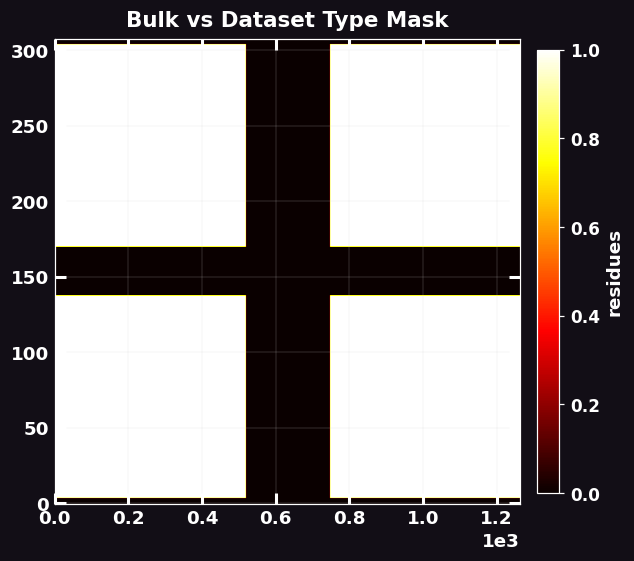

In [6]:
ds.image_plot(
    ds.map4image(
        img=wfm.bulk,
        title='Bulk vs Dataset Type Mask',
        cbarlabel='residues',
        img_kwargs={
            'aspect': wfm.shape_detector[1] / wfm.shape_detector[0],
            'cmap': 'hot',
        },
    )
)

In [7]:
# data from camera A
sdlA = ds.get_data(filepaths[ID_CAMERA_A][DATASET], E_min=E_min, E_max=E_max)
catalogueA = ds.get_catalogue(filepaths[ID_CAMERA_A]['sources'])
true_sky_camA, _ = ds.load_sky(save_path + f"sky_SIMUL_CAM1A_TEST_{ANALYSIS_ID}.fits")
res_sky_camA, _ = ds.load_sky(save_path + f"skyRES_IROS_CAM1A_TEST_{ANALYSIS_ID}.fits")

# Loading data...
# Loading completed!
# Loading data...
# Loading completed!


In [8]:
# data from camera B
sdlB = ds.get_data(filepaths[ID_CAMERA_B][DATASET], E_min=E_min, E_max=E_max)
catalogueB = ds.get_catalogue(filepaths[ID_CAMERA_B]['sources'])
true_sky_camB, _ = ds.load_sky(save_path + f"sky_SIMUL_CAM1B_TEST_{ANALYSIS_ID}.fits")
res_sky_camB, _ = ds.load_sky(save_path + f"skyRES_IROS_CAM1B_TEST_{ANALYSIS_ID}.fits")

# Loading data...
# Loading completed!
# Loading data...
# Loading completed!


In [9]:
log_camA, log_camB = ds.load_database(save_path + f"IROS_sources_database_TEST_{ANALYSIS_ID}.fits")

# Loading data...
# Loading completed!


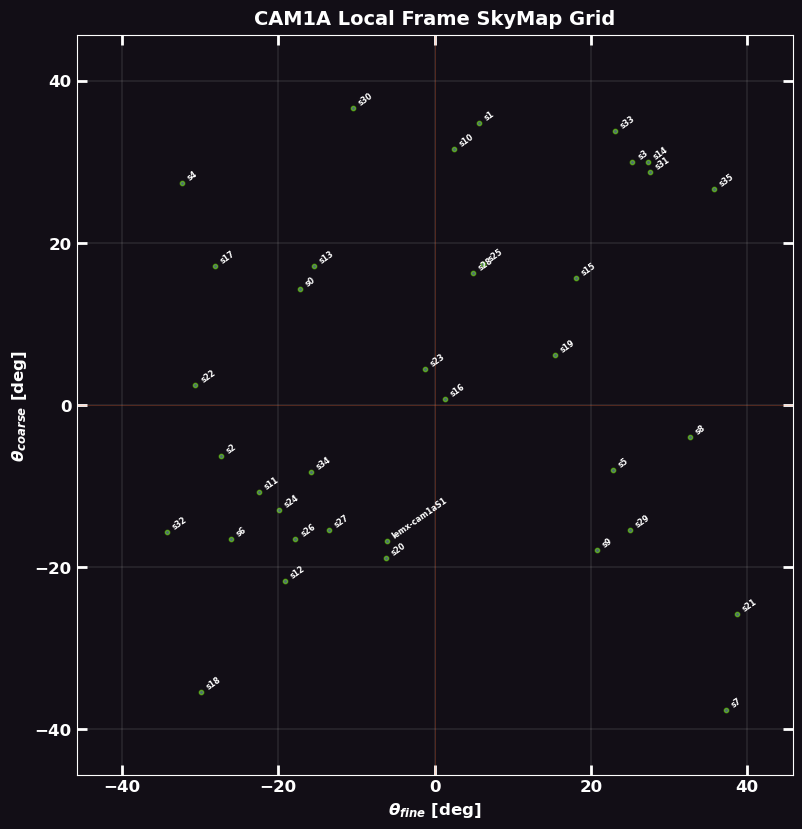


Pixel angular resolution at upscaling (x, y): (2, 1)
  - fine direction: 2.1163 arcmin
  - coarse direction: 8.4653 arcmin



CAM1A                                                              \
              ID     Brightest         SNR DthetaX [arcmin] DthetaY [arcmin]   
0            s17           s17  674.974035         0.004257         0.092347   
1            s29           s29  163.760636         0.078221         1.237110   
2            s11           s11  149.620250         0.017848         2.592694   
3            s25           s25  120.225984         0.133461         2.409648   
4            s13           s13   64.852384         0.169074         3.177006   
5            s12           s12   73.217639         0.007025         6.515872   
6            s32           s32   79.884505         0.008390         1.546120   
7            s24           s24   59.349411         0.173313         3.106680   
8            s22           s22   63.843740         0.077378         0.683406   
9            s19           s19   43.671072         0.132506         1.233664   
10            s2            s2   53.640139         0.021649         6.291245   
11            s0            s0   42.587343         0.005700         3.667935   
12           s10           s10   51.248190         0.173436         3.679075   
13           s27           s27   35.611778         0.141796         4.435780   
14           s26           s26   35.479402         0.044757         3.233932   
15            s9            s9   36.680698         0.082954         2.692819   
16           s31           s31   52.987414         0.022391         3.410738   
17           s33           s33   46.667438         0.094804         1.050466   
18            s5            s5   28.219877         0.158777         2.203243   
19            s8            s8   31.570662         0.025742         3.017686   
20           s20           s20   22.884994         0.196218         5.667609   
21            s6            s6   26.824618         0.139368         0.391874   
22           s35           s35   33.223706         0.016123         0.899013   
23           s18           s18   28.329573         0.086503         2.105842   
24           s23           s23   13.629880         0.049055        12.561847   
25           s21           s21   22.469285         0.000910         3.165606   
26            s1            s1   14.687106         0.091380         2.512156   
27            s4            s4   17.478723         0.043033         9.811709   
28           s34           s34    9.530583         0.219152         0.256384   
29           s16           s16    7.350864         1.001218         3.085145   
30           s15           s15    7.108895         0.277934         7.620815   
31           s14           s14    9.454709         0.315603         1.203557   
32           s28           s28    5.011952         0.196810        18.856376   
33            s3            s3    7.861423         0.270931         6.723498   
34            s7            s7   12.107526         0.087926         0.002869   
35  lemx-cam1aS1  lemx-cam1aS1    5.037094              NaN              NaN   
36           s30           s30    6.407856         0.164508         6.858011   

                 
   Dfluence [%]  
0     -0.648636  
1     -1.221102  
2     -5.600744  
3     -7.828063  
4     -4.220800  
5     -2.237560  
6     -5.363415  
7     -9.549480  
8     11.601604  
9      7.073657  
10     2.555936  
11    -4.029183  
12    -8.740116  
13    -4.316162  
14    -5.801022  
15   -11.337216  
16    -2.132588  
17     3.996623  
18    -6.182517  
19    -2.128297  
20    -5.476570  
21    -1.616635  
22    -1.277006  
23    -0.069483  
24     0.964716  
25     6.090375  
26     3.138465  
27    -4.267148  
28   -15.264369  
29   -14.580070  
30     4.250526  
31    16.712668  
32    -0.386595  
33     2.246497  
34    11.151631  
35          NaN  
36     1.737127

In [10]:
# sources data + angular coords residues plot
ds.skyfield_map(
    log=log_camA,
    camera=wfm,
    save_to=(
        savefile_to(SAVE_TO, f'reconstructed_skymap_{ID_CAMERA_A.upper()}_{ANALYSIS_ID}')
        if SAVE_THINGS else None
    ),
)
reconstruction_data(
    log=log_camA,
    catalogue=catalogueA,
    sdl=sdlA,
    camera=wfm,
    save_to=(
        savefile_to(SAVE_TO, f'reconstruction_data_{ID_CAMERA_A.upper()}_{ANALYSIS_ID}', 'csv')
        if SAVE_THINGS else None
    ),
)

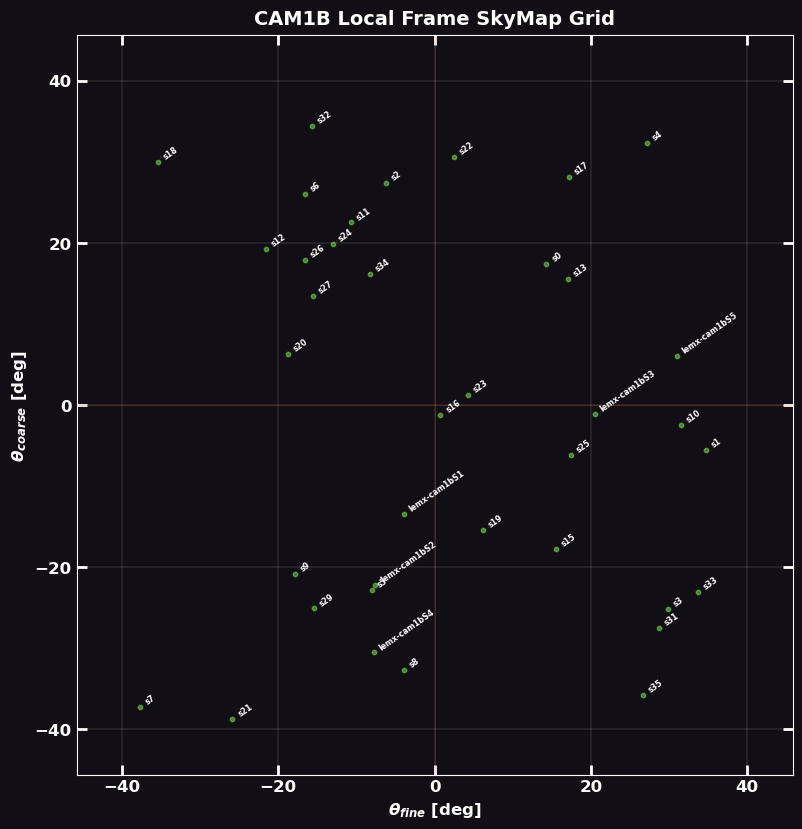


Pixel angular resolution at upscaling (x, y): (2, 1)
  - fine direction: 2.1163 arcmin
  - coarse direction: 8.4653 arcmin



CAM1B                                                              \
              ID     Brightest         SNR DthetaX [arcmin] DthetaY [arcmin]   
0            s17           s17  765.297164         0.000262         0.852581   
1            s29           s29  167.974148         0.088422         2.689119   
2            s25           s25  106.672257         0.064206         0.157839   
3            s19           s19   76.356053         0.828631         2.960567   
4            s26           s26   80.304842         0.077963         2.596462   
5            s11           s11   73.006367         0.088028         1.734945   
6            s24           s24   66.243136         0.547169         3.450931   
7            s13           s13   61.900462         0.006409         0.713598   
8            s12           s12   67.079342         0.021870         3.097707   
9            s27           s27   56.443943         0.065214         5.270998   
10            s2            s2   61.989910         0.204041         2.709746   
11            s9            s9   51.310776         0.019922         5.955875   
12            s5            s5   43.252372         0.217152         0.265239   
13            s8            s8   52.802781         0.557906         0.497322   
14           s22           s22   48.456741         0.885261         1.858931   
15            s6            s6   39.955877         0.006598         1.180453   
16           s10           s10   39.819429         0.029877         1.789532   
17            s0            s0   28.705016         0.046681         5.487029   
18           s32           s32   39.689311         0.126853         6.030106   
19           s18           s18   43.494864         0.093379         3.210341   
20           s23           s23   22.715352         0.254832         1.673954   
21           s20           s20   20.192593         0.089681         3.024176   
22           s33           s33   29.211715         0.204880         0.909767   
23           s35           s35   31.565775         0.128653         1.365248   
24           s34           s34   12.692127         0.192366        15.290636   
25            s4            s4   21.443551         0.033126         0.961704   
26            s1            s1   14.122748         0.299245        10.372068   
27           s31           s31   16.097858         0.071453         1.105882   
28           s21           s21   18.093740         0.236696         0.695511   
29           s16           s16    7.311150         0.019356         1.887436   
30           s15           s15    7.400177         0.540257        15.770702   
31            s7            s7   16.693213         0.070881         5.517765   
32  lemx-cam1bS1  lemx-cam1bS1    5.212646              NaN              NaN   
33  lemx-cam1bS2  lemx-cam1bS2    5.271243              NaN              NaN   
34  lemx-cam1bS3  lemx-cam1bS3    5.143918              NaN              NaN   
35            s3           s14    7.282658         0.718263        10.475781   
36  lemx-cam1bS4  lemx-cam1bS4    5.302608              NaN              NaN   
37  lemx-cam1bS5  lemx-cam1bS5    5.015340              NaN              NaN   

                 
   Dfluence [%]  
0     -0.497512  
1     -2.970159  
2     -9.399523  
3    -18.996572  
4     -5.881245  
5     -4.221701  
6    -13.744183  
7     -2.944020  
8      5.466094  
9      2.304892  
10     1.732421  
11    -3.189846  
12     4.027390  
13    -5.123498  
14   -26.160837  
15    -0.111134  
16    -8.989915  
17   -16.079455  
18     2.833188  
19    -9.767372  
20     4.537000  
21    -7.431184  
22    -0.732740  
23     0.252011  
24    -3.624376  
25    -3.027110  
26     6.137651  
27    -4.503961  
28    -7.167621  
29    -5.251601  
30     0.194504  
31    -3.519172  
32          NaN  
33          NaN  
34          NaN  
35    15.758685  
36          NaN  
37          NaN

In [11]:
# sources data + angular coords residues plot
ds.skyfield_map(
    log=log_camB,
    camera=wfm,
    save_to=(
        savefile_to(SAVE_TO, f'reconstructed_skymap_{ID_CAMERA_B.upper()}_{ANALYSIS_ID}')
        if SAVE_THINGS else None
    ),
)
reconstruction_data(
    log=log_camB,
    catalogue=catalogueB,
    sdl=sdlB,
    camera=wfm,
    save_to=(
        savefile_to(SAVE_TO, f'reconstruction_data_{ID_CAMERA_B.upper()}_{ANALYSIS_ID}', 'csv')
        if SAVE_THINGS else None
    ),
)

In [12]:
assert SOURCES_PROFILING

**Analysis for LEM-X Camera A**

In [13]:
assert ANALYSIS_CAM1A

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


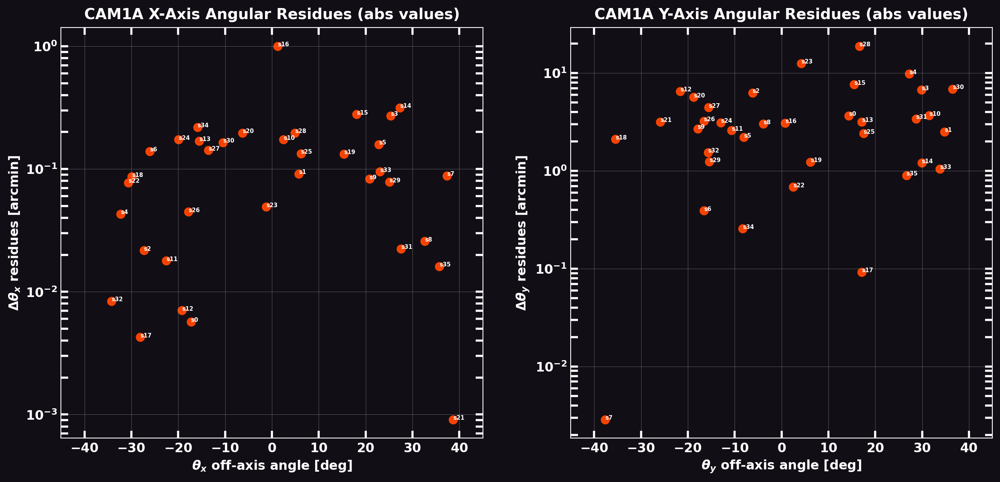

In [14]:
angular_coords = extract_catalogue_angular_coords(log_camA, catalogueA, sdlA, wfm)
cat_theta_x, cat_theta_y = map(
    np.array, (angular_coords['angle_x'], angular_coords['angle_y']),
)

theta_res_x, theta_res_y = get_angularcoords_residues(
    log=log_camA,
    catalogue=catalogueA,
    sdl=sdlA,
    camera=wfm,
)

tags_x = tuple(
    Tag(name, res, theta) for name, res, theta in zip(
        log_camA.log['ID'], theta_res_x, cat_theta_x,
    )
)
tags_y = tuple(
    Tag(name, res, theta) for name, res, theta in zip(
        log_camA.log['ID'], theta_res_y, cat_theta_y,
    )
)
dmapx = ds.map4plot(
    arrs=theta_res_x,
    title=f'{log_camA.name} X-Axis Angular Residues (abs values)',
    xlabel='$\\theta_{{x}}$ off-axis angle [deg]',
    ylabel='$\\Delta\\theta_{{x}}$ residues [arcmin]',
    x=cat_theta_x,
    style='scatter',
    color='OrangeRed',
    xlim=(-45, 45),
    yscale='log',
    tags=tags_x,
)
dmapy = ds.map4plot(
    arrs=theta_res_y,
    title=f'{log_camA.name} Y-Axis Angular Residues (abs values)',
    xlabel='$\\theta_{{y}}$ off-axis angle [deg]',
    ylabel='$\\Delta\\theta_{{y}}$ residues [arcmin]',
    x=cat_theta_y,
    style='scatter',
    color='OrangeRed',
    xlim=(-45, 45),
    yscale='log',
    tags=tags_y,
)

ds.plot(
    (dmapx, dmapy),
    ncols=2,
    save_to=(
        savefile_to(SAVE_TO, f'angularRes_{ID_CAMERA_A.upper()}')
        if SAVE_THINGS else None
    ),
)

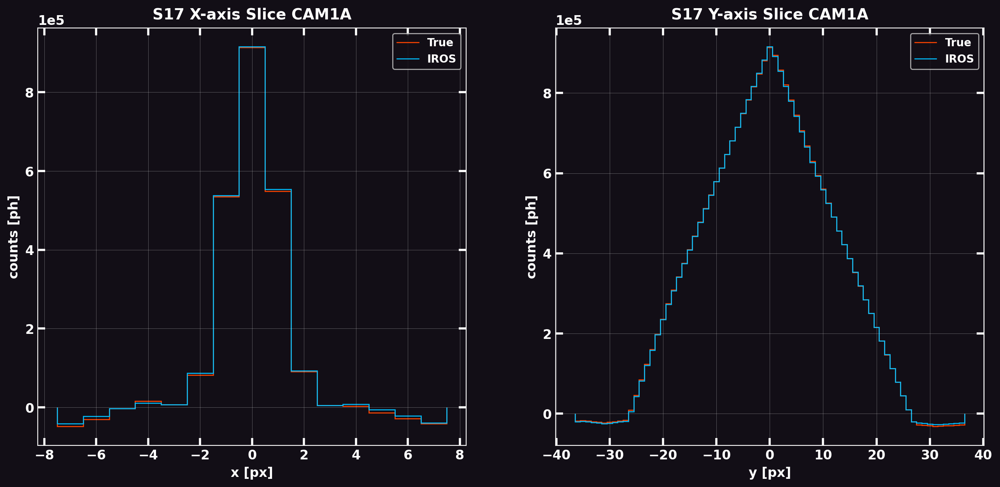

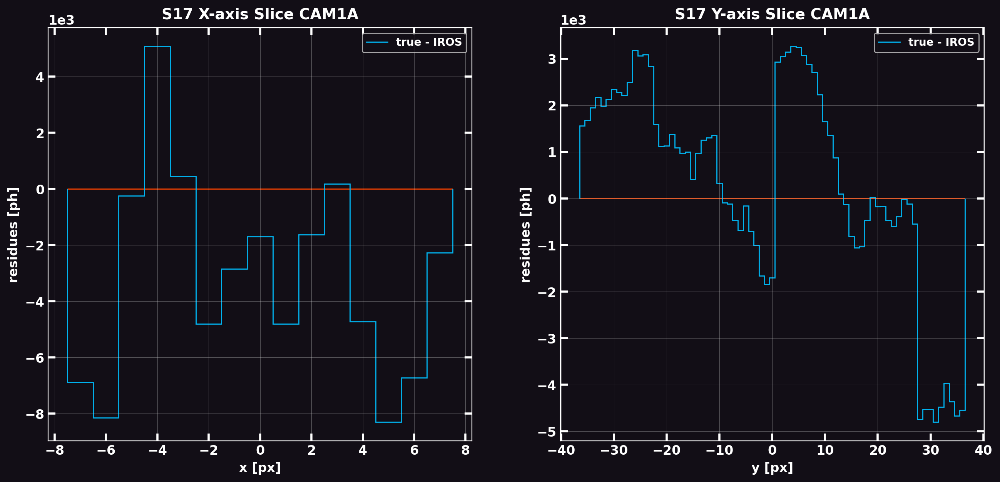

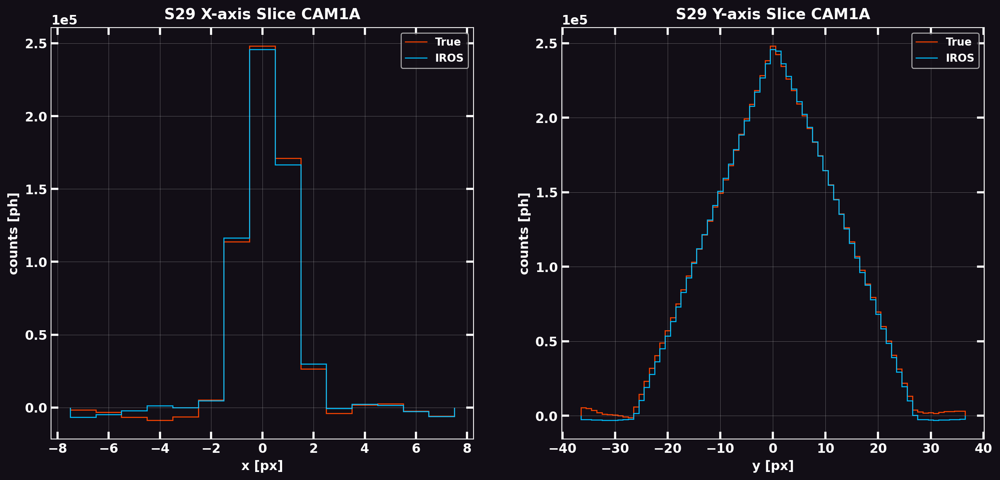

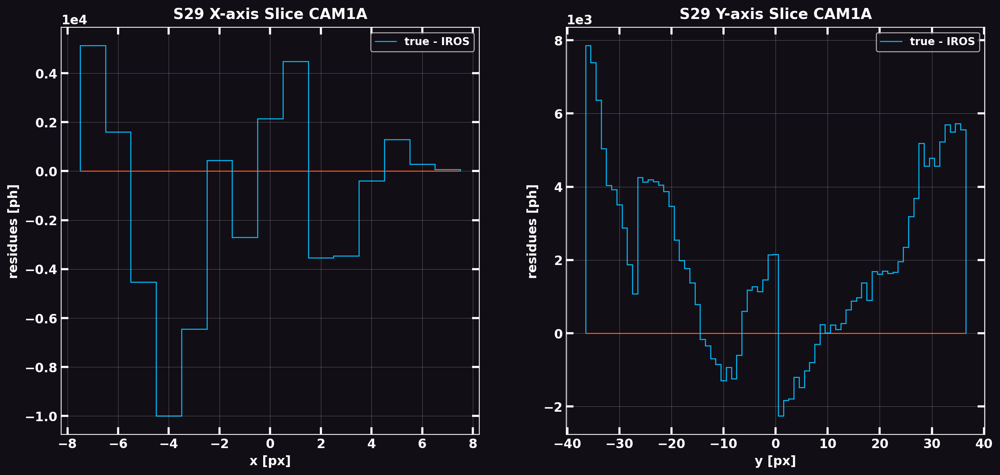

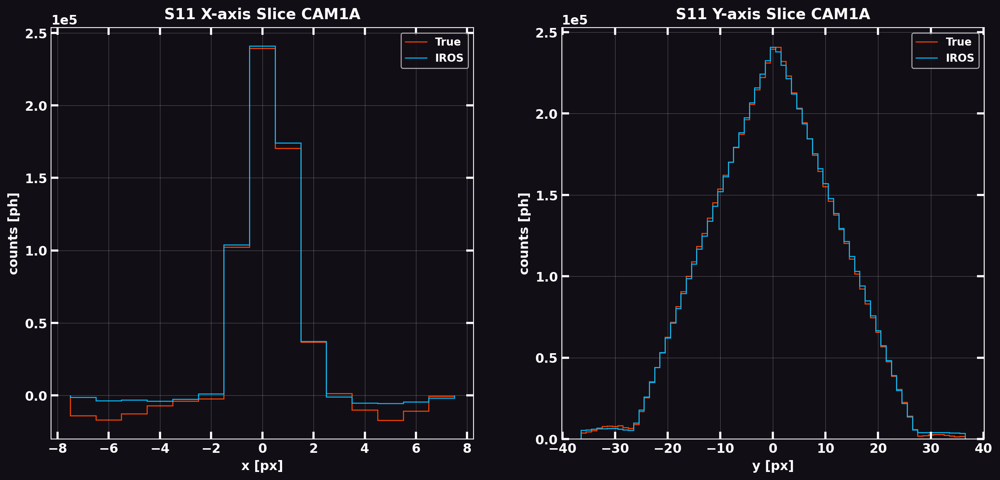

...

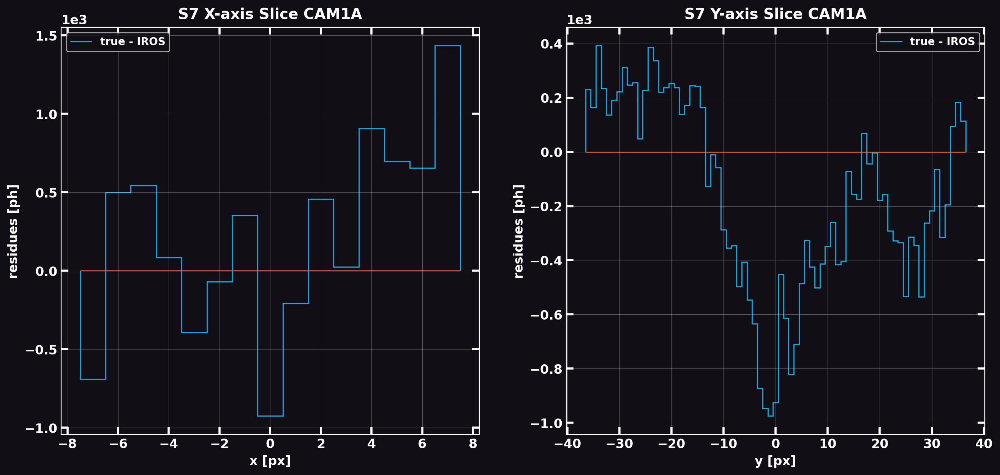

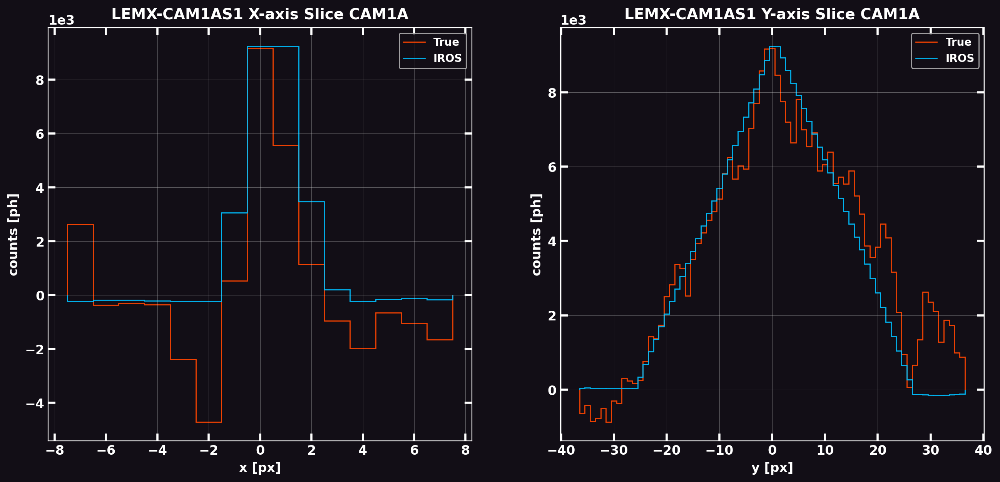

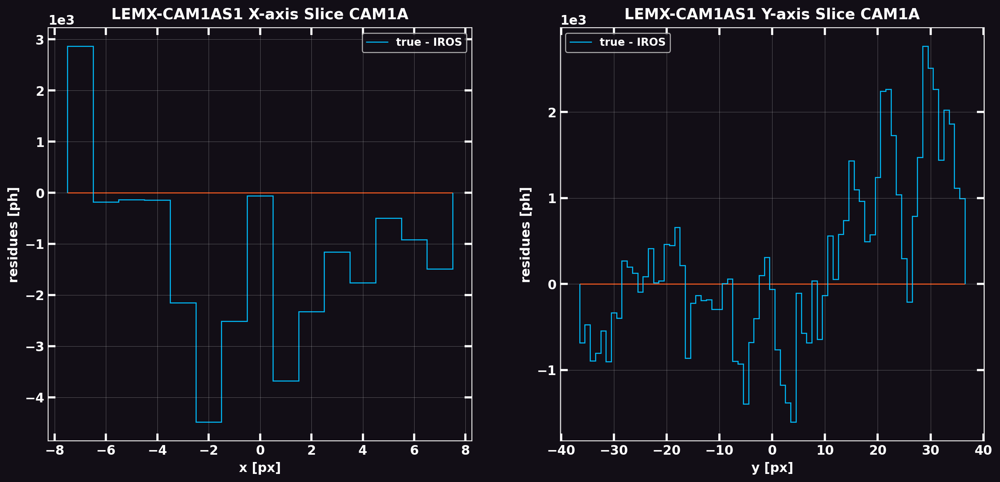

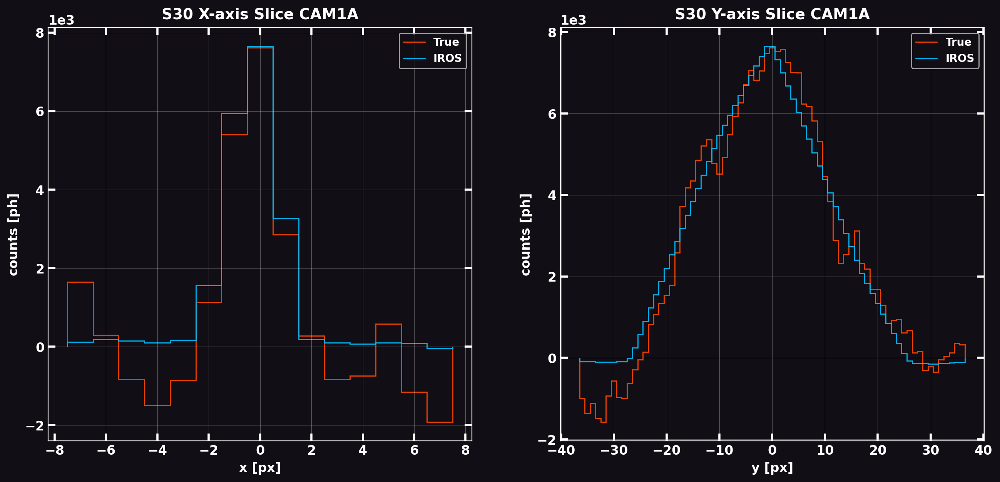

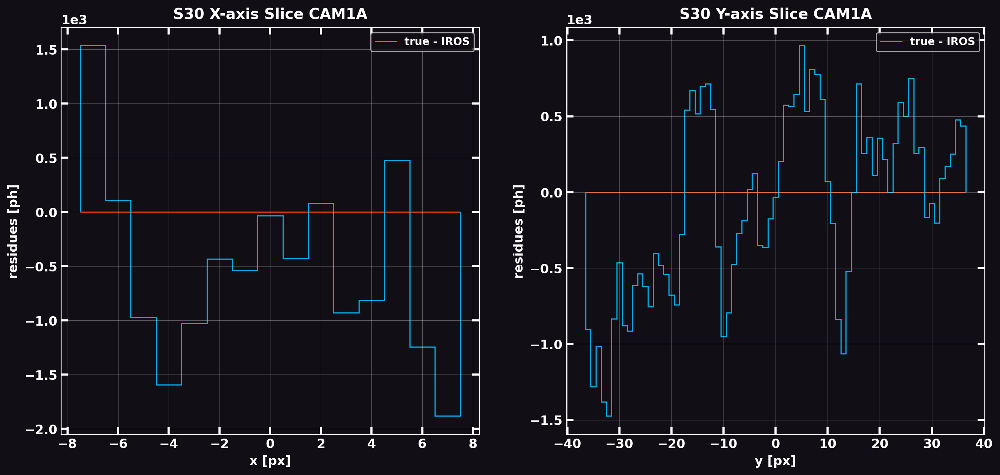

In [15]:
# sources profiles during IROS + residues heatmaps
slit_fine, slit_coarse = ds.psf_extension(wfm)

ds.reconstructed_sources_profiles(
    true_sky=true_sky_camA,
    log=log_camA,
    crp=(slit_coarse + 5, slit_fine + 5),
    camera=wfm,
    vignetting=VIGNETTING,
    psfy=PSFY,
    save_to=SAVE_TO if SAVE_THINGS else None,
)

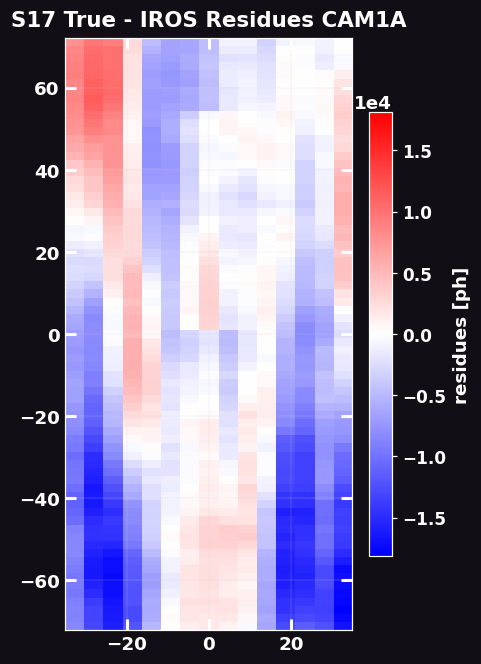

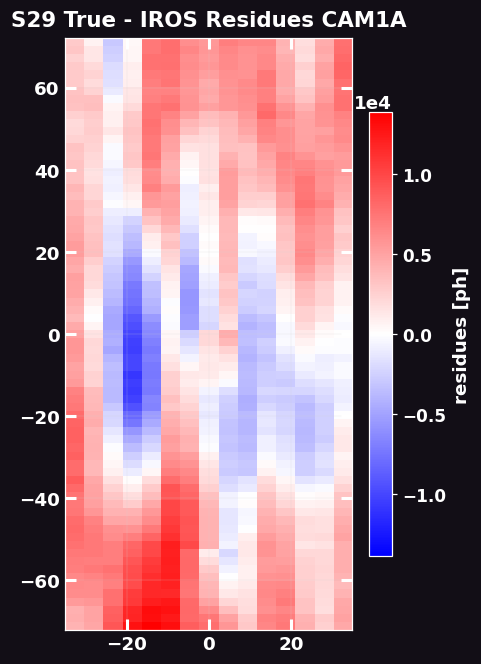

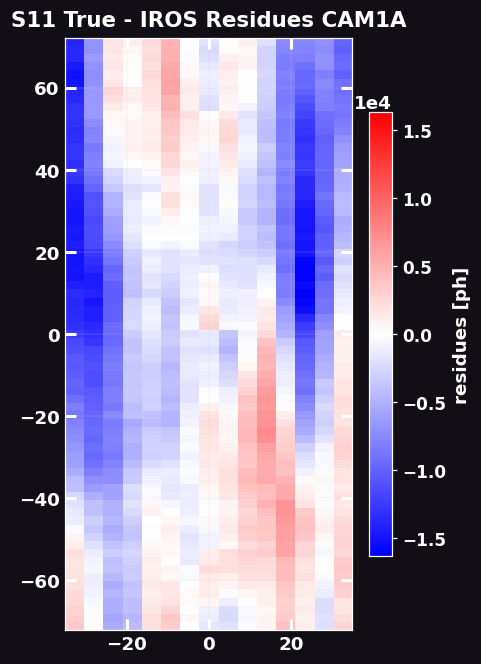

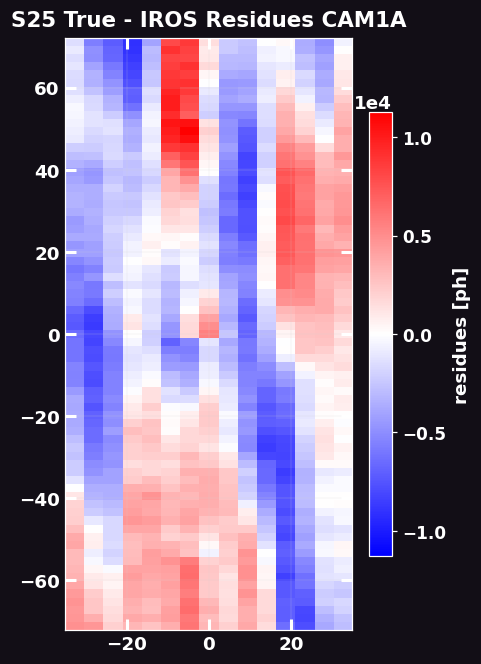

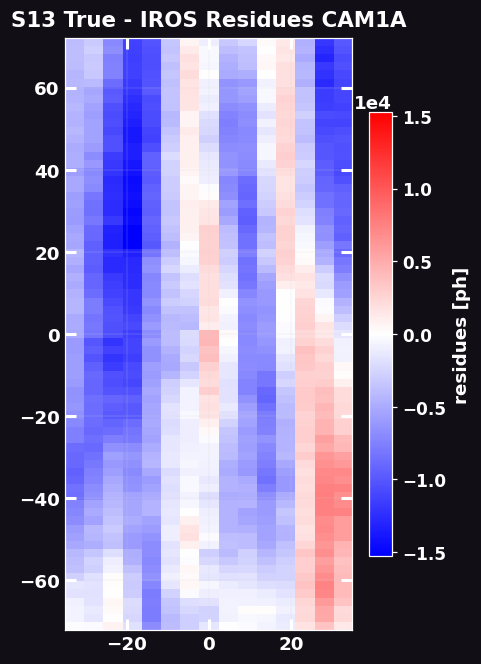

...

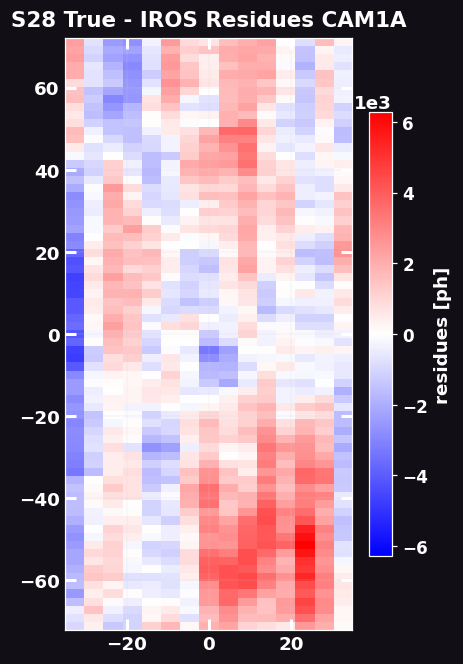

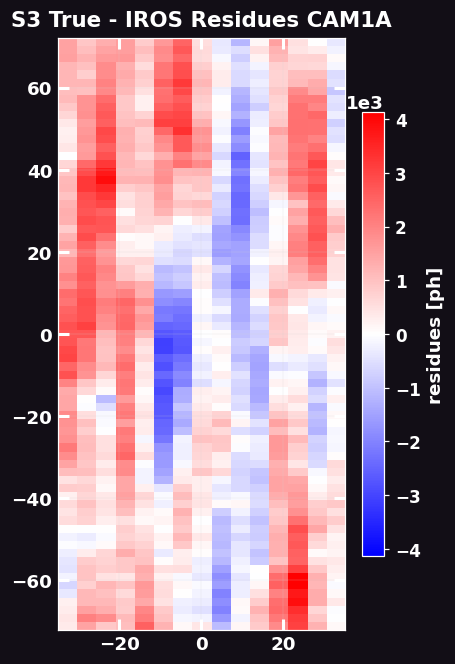

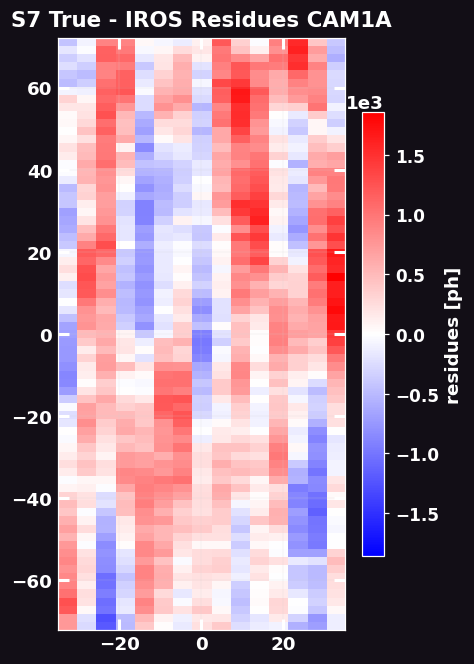

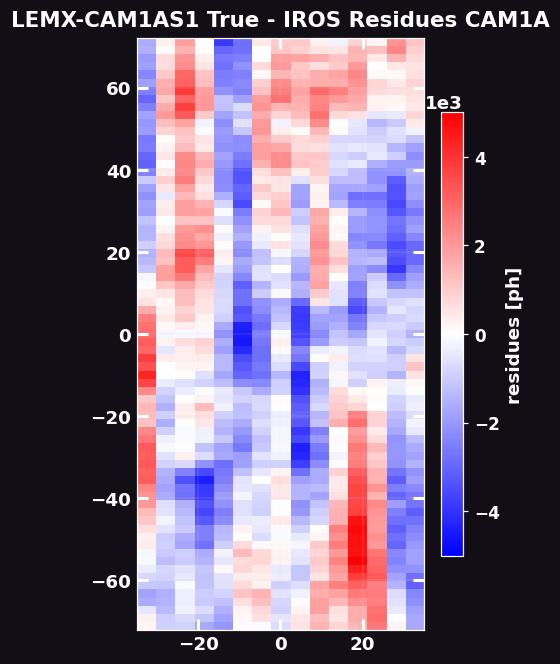

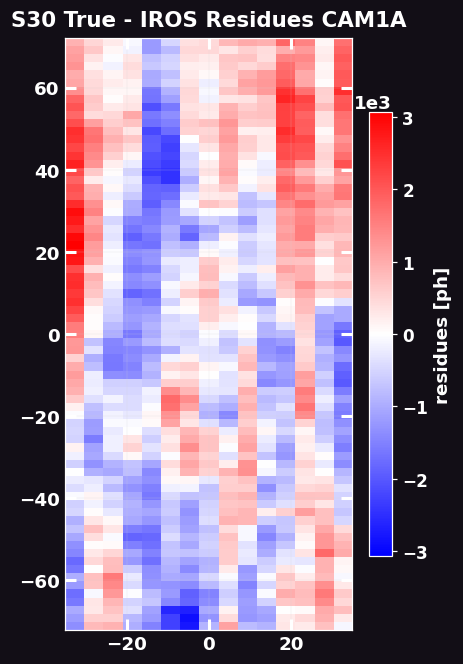

In [16]:
ds.reconstruction_sources_heatmaps(
    true_sky=true_sky_camA,
    log=log_camA,
    crp=(slit_coarse + 5, slit_fine + 5),
    camera=wfm,
    vignetting=VIGNETTING,
    psfy=PSFY,
    save_to=SAVE_TO if SAVE_THINGS else None,
)

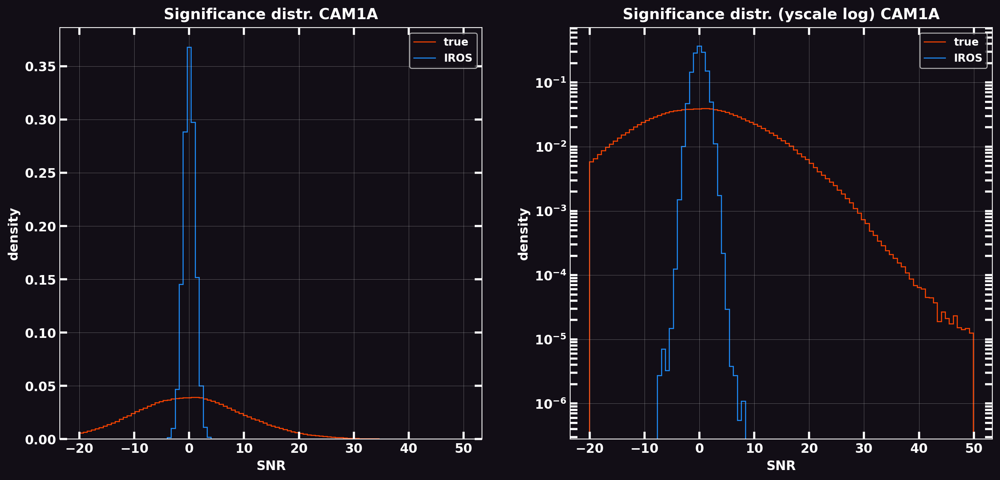

In [17]:
# sky significance distr. for true sky and at the last IROS iteration
detector_camA = count(wfm, sdlA.DLdata)[0]
varmap = variance(wfm, detector_camA)

ycut, xcut = UPS_Y * 30, UPS_X * 20
true_skysnr_camA = ds.unframe(snratio(true_sky_camA, varmap), ycut, xcut)
res_skysnr_camA = ds.unframe(snratio(res_sky_camA, varmap), ycut, xcut)

num_bins = 1000
density = True
hist_true_skysnr, bins = np.histogram(true_skysnr_camA, bins=num_bins, density=density)
hist_res_skysnr, _ = np.histogram(res_skysnr_camA, bins=bins, density=density)


x0, xN = -20, 50
bins_slice, hist_slice = ds.config_distr_limits(bins, x0, xN)

dmap1_snr = ds.map4plot(
    arrs=(hist_true_skysnr[hist_slice], hist_res_skysnr[hist_slice]),
    title=f'Significance distr. {ID_CAMERA_A.upper()}',
    xlabel='SNR',
    ylabel='density',
    labels=('true', 'IROS'),
    x=bins[bins_slice],
    style='stairs',
    color=('OrangeRed', 'Dodgerblue'),
)
dmap2_snr = ds.map4plot(
    arrs=(hist_true_skysnr[hist_slice], hist_res_skysnr[hist_slice]),
    title=f'Significance distr. (yscale log) {ID_CAMERA_A.upper()}',
    xlabel='SNR',
    ylabel='density',
    labels=('true', 'IROS'),
    x=bins[bins_slice],
    style='stairs',
    color=('OrangeRed', 'Dodgerblue'),
    yscale='log',
)
ds.plot(
    dmaps=(dmap1_snr, dmap2_snr),
    ncols=2,
    save_to=(
        savefile_to(SAVE_TO, f'snr_distr_{ID_CAMERA_A.upper()}')
        if SAVE_THINGS else None
    ),
)

**Analysis for LEM-X Camera B**

In [18]:
assert ANALYSIS_CAM1B

AssertionError: 

In [ ]:
angular_coords = extract_catalogue_angular_coords(log_camB, catalogueB, sdlB, wfm)
cat_theta_x, cat_theta_y = map(
    np.array, (angular_coords['angle_x'], angular_coords['angle_y']),
)

theta_res_x, theta_res_y = get_angularcoords_residues(
    log=log_camB,
    catalogue=catalogueB,
    sdl=sdlB,
    camera=wfm,
)

tags_x = tuple(
    Tag(name, res, theta) for name, res, theta in zip(
        log_camB.log['ID'], theta_res_x, cat_theta_x,
    )
)
tags_y = tuple(
    Tag(name, res, theta) for name, res, theta in zip(
        log_camB.log['ID'], theta_res_y, cat_theta_y,
    )
)
dmapx = ds.map4plot(
    arrs=theta_res_x,
    title=f'{log_camB.name} X-Axis Angular Residues (abs values)',
    xlabel='$\\theta_{{x}}$ off-axis angle [deg]',
    ylabel='$\\Delta\\theta_{{x}}$ residues [arcmin]',
    x=cat_theta_x,
    style='scatter',
    color='OrangeRed',
    xlim=(-45, 45),
    yscale='log',
    tags=tags_x,
)
dmapy = ds.map4plot(
    arrs=theta_res_y,
    title=f'{log_camB.name} Y-Axis Angular Residues (abs values)',
    xlabel='$\\theta_{{y}}$ off-axis angle [deg]',
    ylabel='$\\Delta\\theta_{{y}}$ residues [arcmin]',
    x=cat_theta_y,
    style='scatter',
    color='OrangeRed',
    xlim=(-45, 45),
    yscale='log',
    tags=tags_y,
)

ds.plot(
    (dmapx, dmapy),
    ncols=2,
    save_to=(
        savefile_to(SAVE_TO, f'angularRes_{ID_CAMERA_B.upper()}')
        if SAVE_THINGS else None
    ),
)

In [ ]:
# sources profiles during IROS + residues heatmaps
slit_fine, slit_coarse = ds.psf_extension(wfm)

ds.reconstructed_sources_profiles(
    true_sky=true_sky_camB,
    log=log_camB,
    crp=(slit_coarse + 5, slit_fine + 5),
    camera=wfm,
    vignetting=VIGNETTING,
    psfy=PSFY,
    save_to=SAVE_TO if SAVE_THINGS else None,
)

In [ ]:
ds.reconstruction_sources_heatmaps(
    true_sky=true_sky_camB,
    log=log_camB,
    crp=(slit_coarse + 5, slit_fine + 5),
    camera=wfm,
    vignetting=VIGNETTING,
    psfy=PSFY,
    save_to=SAVE_TO if SAVE_THINGS else None,
)

In [ ]:
# sky significance distr. for true sky and at the last IROS iteration
detector_camB = count(wfm, sdlB.DLdata)[0]
varmap = variance(wfm, detector_camB)

ycut, xcut = UPS_Y * 30, UPS_X * 20
true_skysnr_camB = ds.unframe(snratio(true_sky_camA, varmap), ycut, xcut)
res_skysnr_camB = ds.unframe(snratio(res_sky_camA, varmap), ycut, xcut)

num_bins = 1000
density = True
hist_true_skysnr, bins = np.histogram(true_skysnr_camB, bins=num_bins, density=density)
hist_res_skysnr, _ = np.histogram(res_skysnr_camB, bins=bins, density=density)


x0, xN = -20, 50
bins_slice, hist_slice = ds.config_distr_limits(bins, x0, xN)

dmap1_snr = ds.map4plot(
    arrs=(hist_true_skysnr[hist_slice], hist_res_skysnr[hist_slice]),
    title=f'Significance distr. {ID_CAMERA_B.upper()}',
    xlabel='SNR',
    ylabel='density',
    labels=('true', 'IROS'),
    x=bins[bins_slice],
    style='stairs',
    color=('OrangeRed', 'Dodgerblue'),
)
dmap2_snr = ds.map4plot(
    arrs=(hist_true_skysnr[hist_slice], hist_res_skysnr[hist_slice]),
    title=f'Significance distr. (yscale log) {ID_CAMERA_B.upper()}',
    xlabel='SNR',
    ylabel='density',
    labels=('true', 'IROS'),
    x=bins[bins_slice],
    style='stairs',
    color=('OrangeRed', 'Dodgerblue'),
    yscale='log',
)
ds.plot(
    dmaps=(dmap1_snr, dmap2_snr),
    ncols=2,
    save_to=(
        savefile_to(SAVE_TO, f'snr_distr_{ID_CAMERA_B.upper()}')
        if SAVE_THINGS else None
    ),
)